In [9]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
adata1 = sc.read_10x_h5("cell_feature_matrix.h5")
adata2 = sc.read_10x_h5("cell_feature_matrix2.h5")

In [5]:
adata1, adata2

(AnnData object with n_obs × n_vars = 278659 × 289
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 278328 × 5001
     var: 'gene_ids', 'feature_types', 'genome')

In [3]:
dfC1 = pd.read_parquet("cells.parquet")
dfC2 = pd.read_parquet("cells2.parquet")

In [7]:
dfC1.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,nucleus_count,segmentation_method
0,aaaadcac-1,315.479584,4135.815918,35,0,0,0,0,0,35,76.539847,6.863750,1,Segmented by nucleus expansion of 5.0µm
1,aaaaieak-1,317.920197,4126.272461,61,0,0,0,0,0,61,34.002657,12.688907,1,Segmented by nucleus expansion of 5.0µm
2,aaaanbhm-1,318.433136,4109.978027,292,0,0,0,0,0,292,128.514692,30.028907,1,Segmented by nucleus expansion of 5.0µm
3,aaaankfe-1,335.111847,4116.146484,303,1,0,0,0,0,304,85.796878,44.975627,1,Segmented by nucleus expansion of 5.0µm
4,aaaankfi-1,341.734100,4125.354980,32,0,0,0,0,0,32,63.038127,14.540313,1,Segmented by nucleus expansion of 5.0µm


In [4]:
dfT1 = pd.read_parquet("transcripts.parquet")
dfT2 = pd.read_parquet("transcripts2.parquet")

In [8]:
dfT1.head()

,transcript_id,cell_id,overlaps_nucleus,feature_name,x_location,y_location,z_location,qv,fov_name,nucleus_distance,codeword_index,codeword_category,is_gene
0,281788509457311,UNASSIGNED,0,ACKR1,211.765625,3658.734375,12.296875,40.0,G1,363.640625,53,predesigned_gene,True
1,281788509415128,UNASSIGNED,0,ADAM17,244.750000,3648.156250,12.250000,20.5,G1,356.718750,304,predesigned_gene,True
2,281788509391871,UNASSIGNED,0,ADAM28,179.671875,3668.328125,12.343750,40.0,G1,373.890625,340,predesigned_gene,True
3,281788509332364,UNASSIGNED,0,AGR3,238.218750,3696.171875,12.359375,40.0,G1,317.875000,77,predesigned_gene,True
4,281788509358644,UNASSIGNED,0,AGR3,92.281250,3723.468750,12.468750,40.0,G1,395.828125,77,predesigned_gene,True


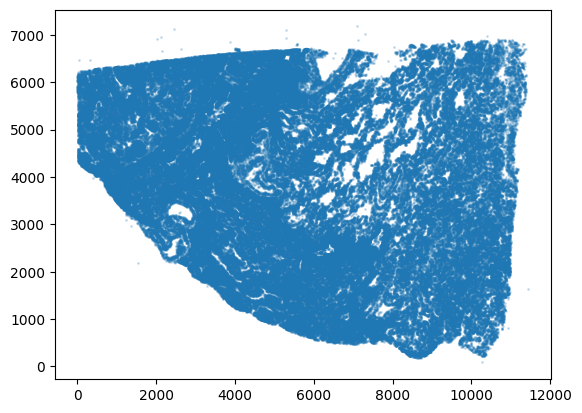

In [11]:
xI = np.array(dfC1['x_centroid'])
yI = np.array(dfC1['y_centroid'])

# plot
fig,ax = plt.subplots()
ax.scatter(xI,yI,s=1,alpha=0.2)

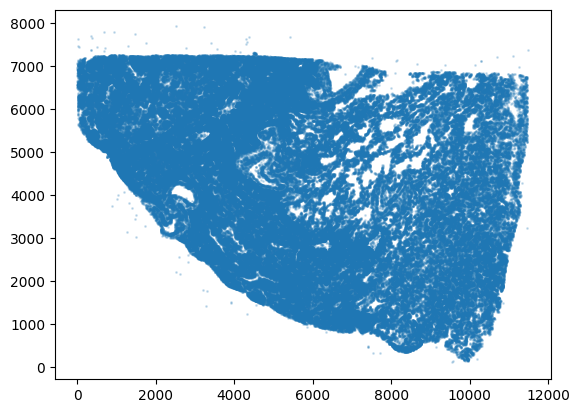

In [12]:
xI = np.array(dfC2['x_centroid'])
yI = np.array(dfC2['y_centroid'])

# plot
fig,ax = plt.subplots()
ax.scatter(xI,yI,s=1,alpha=0.2)

In [15]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import cKDTree
from scipy.optimize import minimize
import anndata

# Load existing data
adata1 = sc.read_10x_h5("cell_feature_matrix.h5")
adata2 = sc.read_10x_h5("cell_feature_matrix2.h5")
dfC1 = pd.read_parquet("cells.parquet")
dfC2 = pd.read_parquet("cells2.parquet")
dfT1 = pd.read_parquet("transcripts.parquet")
dfT2 = pd.read_parquet("transcripts.parquet")

# 1. Prepare spatial coordinates
# Extract cell centroids
cells1_coords = dfC1[['cell_id', 'x_centroid', 'y_centroid']].copy()
cells2_coords = dfC2[['cell_id', 'x_centroid', 'y_centroid']].copy()

# 2. Create AnnData objects with spatial information
# Add spatial coordinates to AnnData objects
adata1.obs['x_centroid'] = cells1_coords.set_index('cell_id').loc[adata1.obs_names, 'x_centroid'].values
adata1.obs['y_centroid'] = cells1_coords.set_index('cell_id').loc[adata1.obs_names, 'y_centroid'].values
adata2.obs['x_centroid'] = cells2_coords.set_index('cell_id').loc[adata2.obs_names, 'x_centroid'].values
adata2.obs['y_centroid'] = cells2_coords.set_index('cell_id').loc[adata2.obs_names, 'y_centroid'].values


Number of common genes: 196


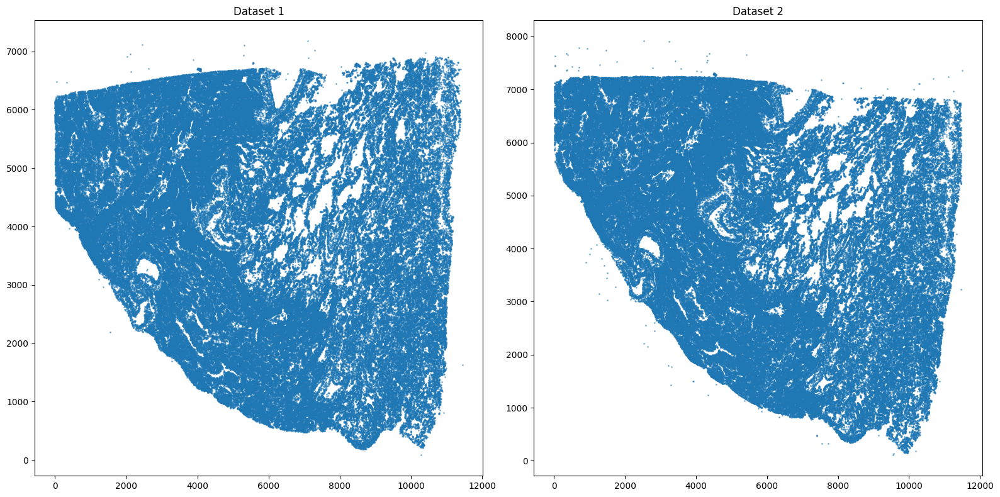

In [16]:
# 3. Visualize the two datasets before alignment
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].scatter(adata1.obs['x_centroid'], adata1.obs['y_centroid'], s=1, alpha=0.5)
ax[0].set_title('Dataset 1')
ax[1].scatter(adata2.obs['x_centroid'], adata2.obs['y_centroid'], s=1, alpha=0.5)
ax[1].set_title('Dataset 2')
plt.tight_layout()
plt.savefig('before_alignment.png')

# 4. Find common genes between the two datasets for better alignment
common_genes = list(set(adata1.var_names).intersection(set(adata2.var_names)))
print(f"Number of common genes: {len(common_genes)}")


In [19]:
# 5. Option 1: Simple rigid transformation alignment
# Define a rigid transformation function (translation, rotation, scaling)
def transform_coords(params, coords):
    tx, ty, theta, scale = params
    x, y = coords[:, 0], coords[:, 1]
    
    # Apply transformation
    x_new = scale * (x * np.cos(theta) - y * np.sin(theta)) + tx
    y_new = scale * (x * np.sin(theta) + y * np.cos(theta)) + ty
    
    return np.column_stack((x_new, y_new))

# Function to calculate alignment error
def alignment_error(params, source_coords, target_coords, tree):
    transformed = transform_coords(params, source_coords)
    distances, _ = tree.query(transformed)
    return np.mean(distances)

# Prepare coordinates for alignment
source_coords = np.array(adata2.obs[['x_centroid', 'y_centroid']])
target_coords = np.array(adata1.obs[['x_centroid', 'y_centroid']])

# Build KD-tree for fast nearest neighbor search
tree = cKDTree(target_coords)

# Initial parameters: [tx, ty, theta, scale]
initial_params = [0, 0, 0, 1.5]

# Optimize transformation parameters
result = minimize(
    alignment_error,
    initial_params,
    args=(source_coords, target_coords, tree),
    method='Powell'
)

# Apply the optimized transformation
optimal_params = result.x
transformed_coords = transform_coords(optimal_params, source_coords)


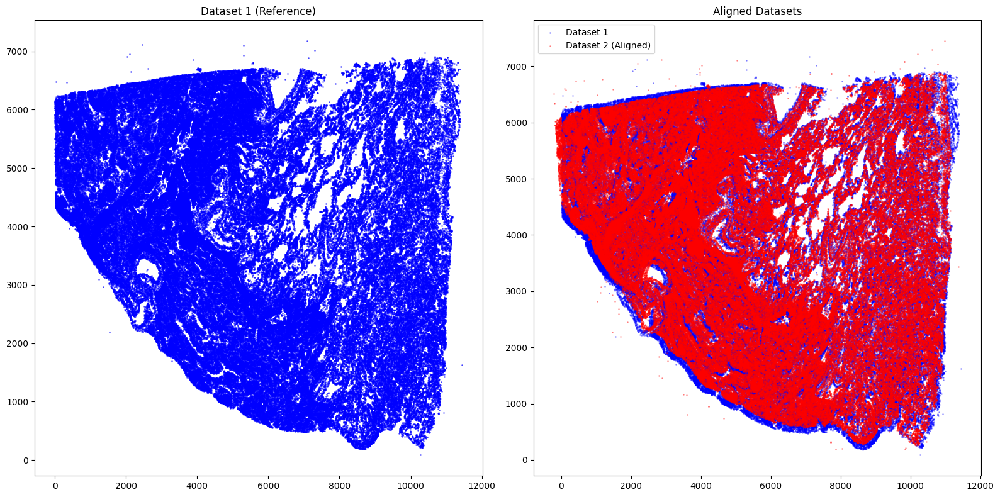

In [20]:
# 6. Visualize aligned datasets
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].scatter(target_coords[:, 0], target_coords[:, 1], s=1, alpha=0.5, c='blue', label='Dataset 1')
ax[0].set_title('Dataset 1 (Reference)')
ax[1].scatter(target_coords[:, 0], target_coords[:, 1], s=1, alpha=0.3, c='blue', label='Dataset 1')
ax[1].scatter(transformed_coords[:, 0], transformed_coords[:, 1], s=1, alpha=0.3, c='red', label='Dataset 2 (Aligned)')
ax[1].set_title('Aligned Datasets')
ax[1].legend()
plt.tight_layout()
plt.savefig('after_alignment.png')

In [21]:
# 7. Create a new AnnData object with aligned coordinates
adata2_aligned = adata2.copy()
adata2_aligned.obs['x_aligned'] = transformed_coords[:, 0]
adata2_aligned.obs['y_aligned'] = transformed_coords[:, 1]

In [22]:
# 8. Option 2: Feature-based alignment if simple alignment isn't sufficient
# This would use landmark features or gene expression patterns to align
# For more complex cases, consider using tools like Harmony or MNN

# Example: Create a combined dataset with aligned coordinates
# Only include common genes
adata1_common = adata1[:, common_genes].copy()
adata2_common = adata2[:, common_genes].copy()

In [23]:
# Add batch information
adata1_common.obs['batch'] = 'batch1'
adata2_common.obs['batch'] = 'batch2'

# Update adata2 coordinates with aligned ones
adata2_common.obs['x_centroid'] = transformed_coords[:, 0]
adata2_common.obs['y_centroid'] = transformed_coords[:, 1]

# Combine datasets
combined = anndata.concat([adata1_common, adata2_common], join='inner')

# 9. Save aligned data
adata2_aligned.write('adata2_aligned.h5ad')
combined.write('combined_aligned.h5ad')

/scratch/work/sagara22/data-pre/.sqvenv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [24]:
# 10. Optional: Map transcripts from second dataset to aligned coordinates
# This transforms the individual transcript coordinates
def transform_transcripts(df_transcripts, params):
    tx, ty, theta, scale = params
    
    # Create a copy of the dataframe
    df_aligned = df_transcripts.copy()
    
    # Transform coordinates
    x = df_aligned['x_location'].values
    y = df_aligned['y_location'].values
    
    # Apply transformation
    df_aligned['x_aligned'] = scale * (x * np.cos(theta) - y * np.sin(theta)) + tx
    df_aligned['y_aligned'] = scale * (x * np.sin(theta) + y * np.cos(theta)) + ty
    
    return df_aligned

# Transform transcript coordinates
dfT2_aligned = transform_transcripts(dfT2, optimal_params)

# Save aligned transcript data
dfT2_aligned.to_parquet('transcripts2_aligned.parquet')

print("Alignment complete. Optimized parameters:", optimal_params)

Alignment complete. Optimized parameters: [ 5.51528540e+02 -9.20083075e+02  1.07015743e-01  9.79484642e-01]


In [25]:
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import numpy as np

# Load your aligned data (assuming you've saved it as in the previous script)
# If you haven't saved it yet, use the data from your current session
try:
    # adata1 = sc.read_h5ad('adata1.h5ad')  # Original reference dataset
    adata2_aligned = sc.read_h5ad('adata2_aligned.h5ad')  # Aligned dataset
    combined = sc.read_h5ad('combined_aligned.h5ad')  # Combined dataset
except:
    # If files don't exist, you'll need to use your current objects
    print("Using data from current session")
    # Make sure you have adata1, adata2_aligned, and combined in your session

/scratch/work/sagara22/data-pre/.sqvenv/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


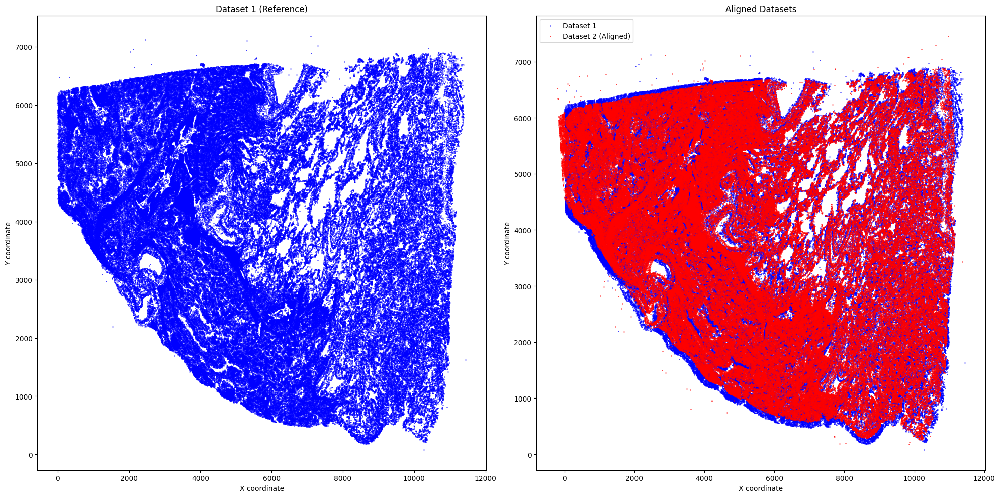

/tmp/ipykernel_2212508/3414792695.py:39: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('alignment_zoom.png', dpi=300)
/scratch/work/sagara22/data-pre/.sqvenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


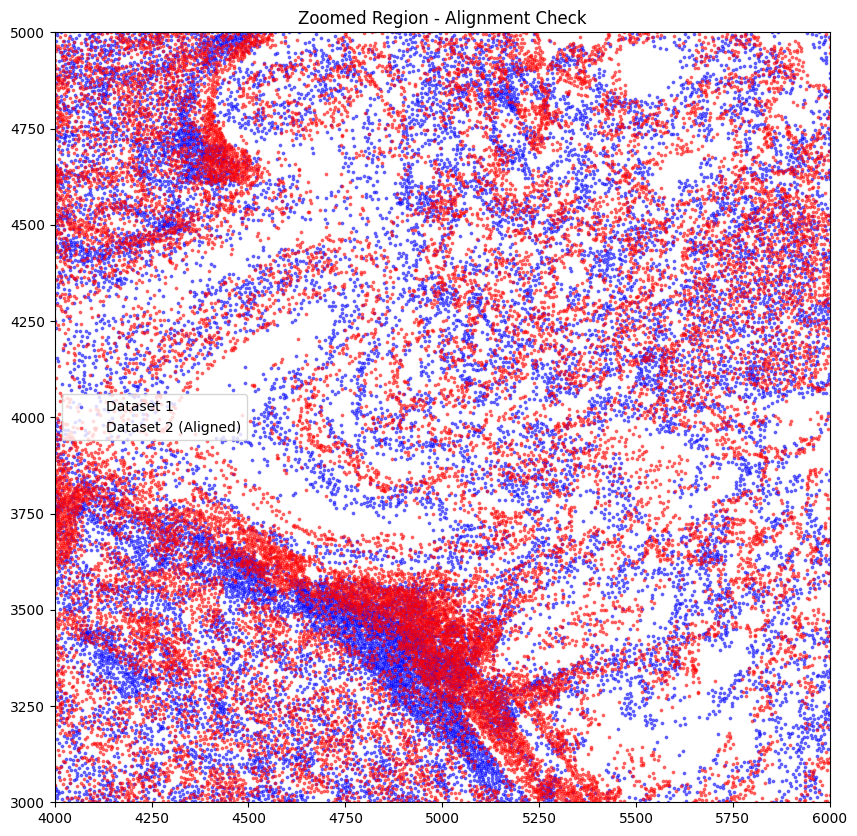

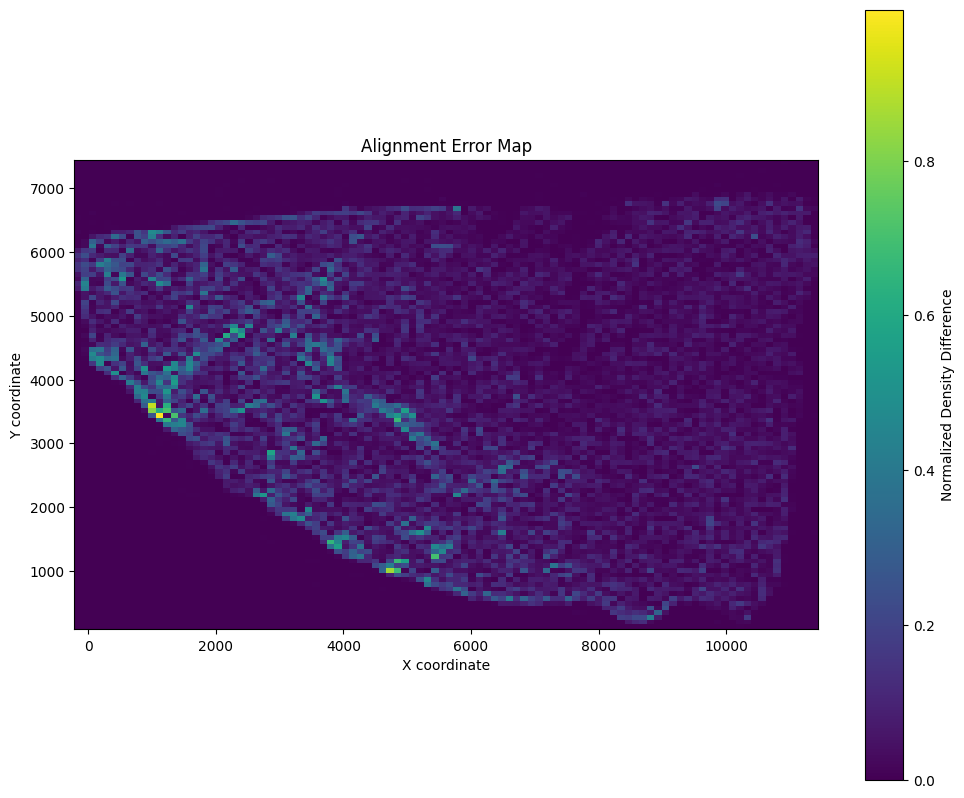

Average alignment error: 0.0514
Maximum alignment error: 0.9955


/tmp/ipykernel_2212508/3414792695.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


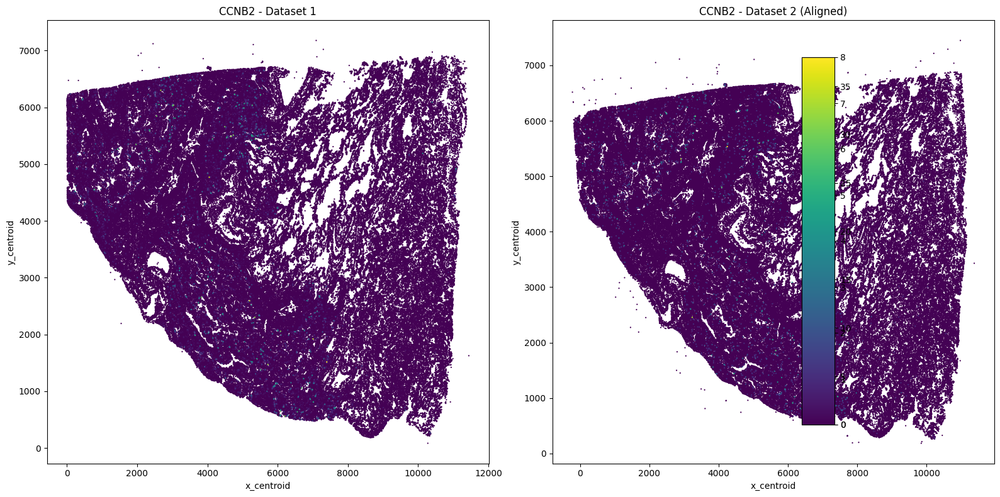

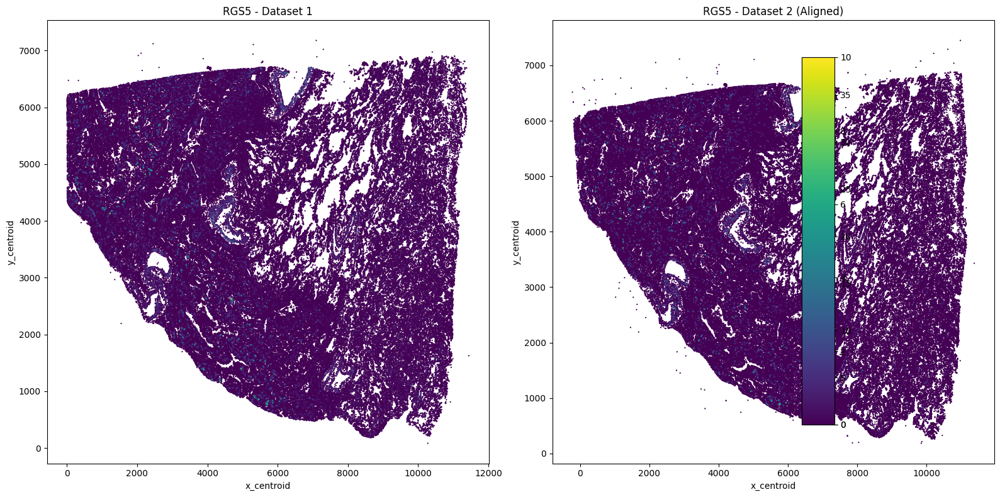

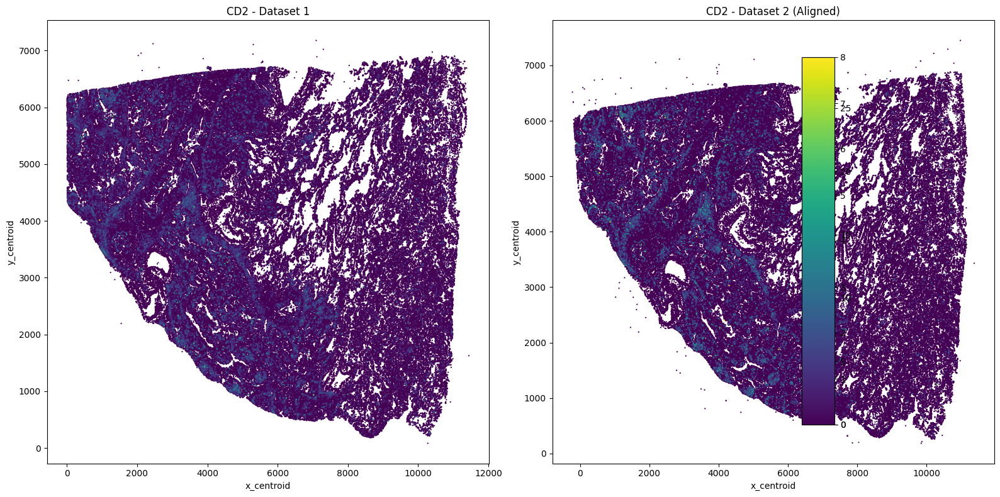

In [26]:

# 1. Visualize the aligned datasets
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# Original reference dataset
ax[0].scatter(adata1.obs['x_centroid'], adata1.obs['y_centroid'], 
              s=1, alpha=0.5, c='blue', label='Dataset 1')
ax[0].set_title('Dataset 1 (Reference)')
ax[0].set_xlabel('X coordinate')
ax[0].set_ylabel('Y coordinate')

# Overlay of both datasets
ax[1].scatter(adata1.obs['x_centroid'], adata1.obs['y_centroid'], 
              s=1, alpha=0.5, c='blue', label='Dataset 1')
ax[1].scatter(adata2_aligned.obs['x_aligned'], adata2_aligned.obs['y_aligned'], 
              s=1, alpha=0.5, c='red', label='Dataset 2 (Aligned)')
ax[1].set_title('Aligned Datasets')
ax[1].set_xlabel('X coordinate')
ax[1].set_ylabel('Y coordinate')
ax[1].legend()

plt.tight_layout()
plt.savefig('alignment_visualization.png', dpi=300)
plt.show()

# 2. Create a zoomed visualization of a specific region to check alignment quality
# Choose a region of interest (adjust coordinates as needed)
x_min, x_max = 4000, 6000  # Example values - adjust based on your data
y_min, y_max = 3000, 5000  # Example values - adjust based on your data

fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(adata1.obs['x_centroid'], adata1.obs['y_centroid'], 
           s=3, alpha=0.5, c='blue', label='Dataset 1')
ax.scatter(adata2_aligned.obs['x_aligned'], adata2_aligned.obs['y_aligned'], 
           s=3, alpha=0.5, c='red', label='Dataset 2 (Aligned)')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_title('Zoomed Region - Alignment Check')
ax.legend()
plt.savefig('alignment_zoom.png', dpi=300)
plt.show()

# 3. Calculate and visualize the alignment error
if 'x_aligned' in adata2_aligned.obs.columns:
    # Create a combined dataframe for easier manipulation
    df1 = pd.DataFrame({
        'x': adata1.obs['x_centroid'],
        'y': adata1.obs['y_centroid'],
        'dataset': 'Reference'
    })
    
    df2 = pd.DataFrame({
        'x': adata2_aligned.obs['x_aligned'],
        'y': adata2_aligned.obs['y_aligned'],
        'dataset': 'Aligned'
    })
    
    # Combine dataframes
    df_combined = pd.concat([df1, df2])
    
    # Create a grid and calculate cell density difference as a measure of alignment quality
    from scipy.stats import binned_statistic_2d
    
    # Define grid
    bins = 100
    x_range = (df_combined['x'].min(), df_combined['x'].max())
    y_range = (df_combined['y'].min(), df_combined['y'].max())
    
    # Calculate density for each dataset
    density1, x_edges, y_edges, _ = binned_statistic_2d(
        df1['x'], df1['y'], np.ones(len(df1)), 
        statistic='count', bins=bins, range=[x_range, y_range]
    )
    
    density2, _, _, _ = binned_statistic_2d(
        df2['x'], df2['y'], np.ones(len(df2)), 
        statistic='count', bins=bins, range=[x_range, y_range]
    )
    
    # Normalize densities
    density1 = density1 / density1.max()
    density2 = density2 / density2.max()
    
    # Calculate absolute difference as alignment error
    density_diff = np.abs(density1 - density2)
    
    # Visualize alignment error
    fig, ax = plt.subplots(figsize=(12, 10))
    im = ax.imshow(density_diff.T, origin='lower', cmap='viridis', 
                extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]])
    ax.set_title('Alignment Error Map')
    ax.set_xlabel('X coordinate')
    ax.set_ylabel('Y coordinate')
    plt.colorbar(im, ax=ax, label='Normalized Density Difference')
    plt.savefig('alignment_error_map.png', dpi=300)
    plt.show()
    
    print(f"Average alignment error: {np.mean(density_diff):.4f}")
    print(f"Maximum alignment error: {np.max(density_diff):.4f}")

# 4. Assess alignment with gene expression (optional)
# Check if we have gene expression data in the combined object
if combined is not None and len(combined.var_names) > 0:
    # Select a few marker genes to visualize
    # Replace these with genes relevant to your tissue
    marker_genes = combined.var_names[:3]  # Just taking first 3 genes as example
    
    for gene in marker_genes:
        fig, ax = plt.subplots(1, 2, figsize=(16, 8))
        
        # Plot gene expression in dataset 1
        sc.pl.scatter(combined[combined.obs['batch'] == 'batch1'], 
                     x='x_centroid', y='y_centroid', 
                     color=gene, size=10, ax=ax[0], show=False)
        ax[0].set_title(f'{gene} - Dataset 1')
        
        # Plot gene expression in dataset 2
        sc.pl.scatter(combined[combined.obs['batch'] == 'batch2'], 
                     x='x_centroid', y='y_centroid', 
                     color=gene, size=10, ax=ax[1], show=False)
        ax[1].set_title(f'{gene} - Dataset 2 (Aligned)')
        
        plt.tight_layout()
        plt.savefig(f'gene_{gene}_comparison.png', dpi=300)
        plt.show()